In [3]:

import anndata
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scanpy as sc


In [4]:
sns.reset_orig()
sc.settings._vector_friendly = True

plt.rcParams["svg.fonttype"] = "none"
plt.rcParams["pdf.fonttype"] = 42
plt.rcParams['ps.fonttype'] = 42

plt.rcParams["savefig.transparent"] = True
plt.rcParams["figure.figsize"] = (4, 4)

plt.rcParams["axes.titlesize"] = 15
plt.rcParams["axes.titleweight"] = 500
plt.rcParams["axes.titlepad"] = 8.0
plt.rcParams["axes.labelsize"] = 14
plt.rcParams["axes.labelweight"] = 500
plt.rcParams["axes.linewidth"] = 1.2
plt.rcParams["axes.labelpad"] = 6.0
plt.rcParams["axes.spines.top"] = False
plt.rcParams["axes.spines.right"] = False


plt.rcParams["font.size"] = 11
plt.rcParams['font.sans-serif'] = ['Helvetica', "Computer Modern Sans Serif", "DejaVU Sans"]
plt.rcParams['font.weight'] = 500

plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['xtick.minor.size'] = 1.375
plt.rcParams['xtick.major.size'] = 2.75
plt.rcParams['xtick.major.pad'] = 2
plt.rcParams['xtick.minor.pad'] = 2

plt.rcParams['ytick.labelsize'] = 12
plt.rcParams['ytick.minor.size'] = 1.375
plt.rcParams['ytick.major.size'] = 2.75
plt.rcParams['ytick.major.pad'] = 2
plt.rcParams['ytick.minor.pad'] = 2

plt.rcParams["legend.fontsize"] = 12
plt.rcParams['legend.handlelength'] = 1.4
plt.rcParams['legend.numpoints'] = 1
plt.rcParams['legend.scatterpoints'] = 3
plt.rcParams['legend.frameon'] = False

plt.rcParams['lines.linewidth'] = 1.7

DPI = 300

# Updating clusters and variant names

In [5]:



adata = anndata.read('../data/round1round2_processed.h5ad')
adata = adata[adata.obs['round']=='round_2'].copy()
adata.write('round2_processed.h5ad')

fn = 'round2_processed.h5ad'
adata = anndata.read(fn)

In [6]:
adata

AnnData object with n_obs × n_vars = 10615 × 36611
    obs: 'infection', 'variant', 'condition', 'library_size', 'library_size_log', 'SARS2_genome_ORF1ab_counts', 'SARS2_genome_ORF1ab_log', 'SARS2_genome_S_counts', 'SARS2_genome_S_log', 'SARS2_genome_ORF3a_counts', 'SARS2_genome_ORF3a_log', 'SARS2_genome_E_counts', 'SARS2_genome_E_log', 'SARS2_genome_M_counts', 'SARS2_genome_M_log', 'SARS2_genome_ORF6_counts', 'SARS2_genome_ORF6_log', 'SARS2_genome_ORF7a_counts', 'SARS2_genome_ORF7a_log', 'SARS2_genome_ORF8_counts', 'SARS2_genome_ORF8_log', 'SARS2_genome_N_counts', 'SARS2_genome_N_log', 'SARS2_genome_ORF10_counts', 'SARS2_genome_ORF10_log', 'sars2_total_counts', 'sars2_total_counts_log', 'sars2_lib_size_ratio', 'round', 'condition_variant', 'round_variant_condition', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'ts_consensus_prediction', 'ts_consensus_percentage', 'knn_on_bbknn_pred', 'knn_on_scvi_offline_pred', 'scanvi_offline_pred', 'svm_pred', 'rf_pred', 

In [7]:
variant_replace_dict= {'B.1.351': 'Beta_A',
'B.1.351_delta': 'Beta_B',
'B.1.1.7': 'Alpha',
'B.1.429': 'Epsilon',
'WA1_2': 'WA-1', 
'Uninfected_2':'Uninfected'
                 }
adata.obs['variant'] = adata.obs['variant'].replace(variant_replace_dict)

## update umap

In [8]:
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.umap(adata, min_dist=0.2)

... storing 'variant' as categorical


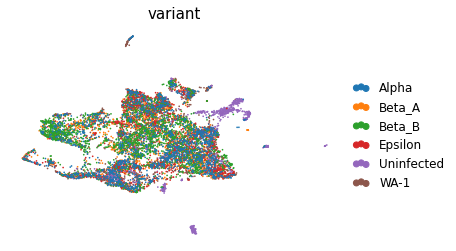

In [9]:
sc.pl.umap(adata, 
           color = ['variant'],
           ncols = 1, 
           frameon=False,
          )

# infection per variant

In [10]:
adata

AnnData object with n_obs × n_vars = 10615 × 36611
    obs: 'infection', 'variant', 'condition', 'library_size', 'library_size_log', 'SARS2_genome_ORF1ab_counts', 'SARS2_genome_ORF1ab_log', 'SARS2_genome_S_counts', 'SARS2_genome_S_log', 'SARS2_genome_ORF3a_counts', 'SARS2_genome_ORF3a_log', 'SARS2_genome_E_counts', 'SARS2_genome_E_log', 'SARS2_genome_M_counts', 'SARS2_genome_M_log', 'SARS2_genome_ORF6_counts', 'SARS2_genome_ORF6_log', 'SARS2_genome_ORF7a_counts', 'SARS2_genome_ORF7a_log', 'SARS2_genome_ORF8_counts', 'SARS2_genome_ORF8_log', 'SARS2_genome_N_counts', 'SARS2_genome_N_log', 'SARS2_genome_ORF10_counts', 'SARS2_genome_ORF10_log', 'sars2_total_counts', 'sars2_total_counts_log', 'sars2_lib_size_ratio', 'round', 'condition_variant', 'round_variant_condition', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'ts_consensus_prediction', 'ts_consensus_percentage', 'knn_on_bbknn_pred', 'knn_on_scvi_offline_pred', 'scanvi_offline_pred', 'svm_pred', 'rf_pred', 

In [11]:
tmp_adata = adata[adata.obs['infection']=='I'].copy()

In [12]:
df = tmp_adata.obs[['variant', 'infection_gmm_annotated']].groupby(['variant', 'infection_gmm_annotated']).size().unstack(1)

In [13]:
df

infection_gmm_annotated,High Infection,Low Infection,No Infection
variant,,,
Alpha,218,32,1438
Beta_A,266,109,1757
Beta_B,594,487,1198
Epsilon,148,146,1117
WA-1,157,83,1704


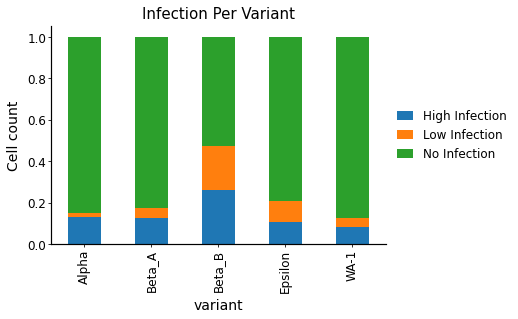

In [16]:
ax = df.plot.bar(stacked=True)
ax.set_xlabel('variant')
ax.set_ylabel('Cell count')
ax.set_title('Infection Per Variant')
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax.get_figure().savefig('round2_figs/infection_per_variant.pdf', bbox_inches='tight', dpi=300)

In [17]:
df = df.divide(np.sum(df, axis=1), axis=0)


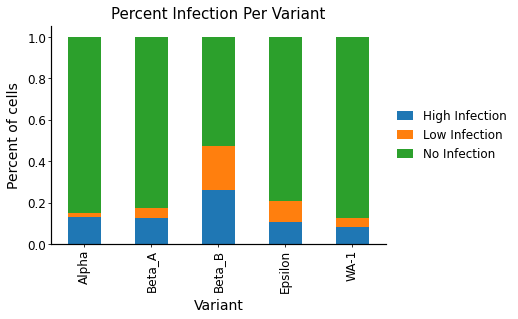

In [18]:
ax = df.plot.bar(stacked=True)
ax.set_title('Percent Infection Per Variant')

ax.set_xlabel('Variant')
ax.set_ylabel('Percent of cells')
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax.get_figure().savefig('round2_figs/4K_infection_per_variant_percentage.pdf', bbox_inches='tight')

# Infection per celltype (removed cilliated cells)

In [67]:
tmp_adata = adata[adata.obs['infection']=='I']

In [68]:
tmp_adata

View of AnnData object with n_obs × n_vars = 9454 × 36611
    obs: 'infection', 'variant', 'condition', 'library_size', 'library_size_log', 'SARS2_genome_ORF1ab_counts', 'SARS2_genome_ORF1ab_log', 'SARS2_genome_S_counts', 'SARS2_genome_S_log', 'SARS2_genome_ORF3a_counts', 'SARS2_genome_ORF3a_log', 'SARS2_genome_E_counts', 'SARS2_genome_E_log', 'SARS2_genome_M_counts', 'SARS2_genome_M_log', 'SARS2_genome_ORF6_counts', 'SARS2_genome_ORF6_log', 'SARS2_genome_ORF7a_counts', 'SARS2_genome_ORF7a_log', 'SARS2_genome_ORF8_counts', 'SARS2_genome_ORF8_log', 'SARS2_genome_N_counts', 'SARS2_genome_N_log', 'SARS2_genome_ORF10_counts', 'SARS2_genome_ORF10_log', 'sars2_total_counts', 'sars2_total_counts_log', 'sars2_lib_size_ratio', 'round', 'condition_variant', 'round_variant_condition', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'ts_consensus_prediction', 'ts_consensus_percentage', 'knn_on_bbknn_pred', 'knn_on_scvi_offline_pred', 'scanvi_offline_pred', 'svm_pred', 'rf_

In [69]:
tmp_adata = tmp_adata[tmp_adata.obs['manual_ct_annotation']!='lung ciliated cell']

In [70]:
tmp_adata

View of AnnData object with n_obs × n_vars = 9447 × 36611
    obs: 'infection', 'variant', 'condition', 'library_size', 'library_size_log', 'SARS2_genome_ORF1ab_counts', 'SARS2_genome_ORF1ab_log', 'SARS2_genome_S_counts', 'SARS2_genome_S_log', 'SARS2_genome_ORF3a_counts', 'SARS2_genome_ORF3a_log', 'SARS2_genome_E_counts', 'SARS2_genome_E_log', 'SARS2_genome_M_counts', 'SARS2_genome_M_log', 'SARS2_genome_ORF6_counts', 'SARS2_genome_ORF6_log', 'SARS2_genome_ORF7a_counts', 'SARS2_genome_ORF7a_log', 'SARS2_genome_ORF8_counts', 'SARS2_genome_ORF8_log', 'SARS2_genome_N_counts', 'SARS2_genome_N_log', 'SARS2_genome_ORF10_counts', 'SARS2_genome_ORF10_log', 'sars2_total_counts', 'sars2_total_counts_log', 'sars2_lib_size_ratio', 'round', 'condition_variant', 'round_variant_condition', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'ts_consensus_prediction', 'ts_consensus_percentage', 'knn_on_bbknn_pred', 'knn_on_scvi_offline_pred', 'scanvi_offline_pred', 'svm_pred', 'rf_

In [71]:
df = tmp_adata.obs.groupby(['manual_ct_annotation', 'infection_gmm_annotated']).size().unstack(1)

In [72]:
df.index = [f'{a} \n (n={b})' for a,b in zip(df.index,np.sum(df, axis=1).values)]

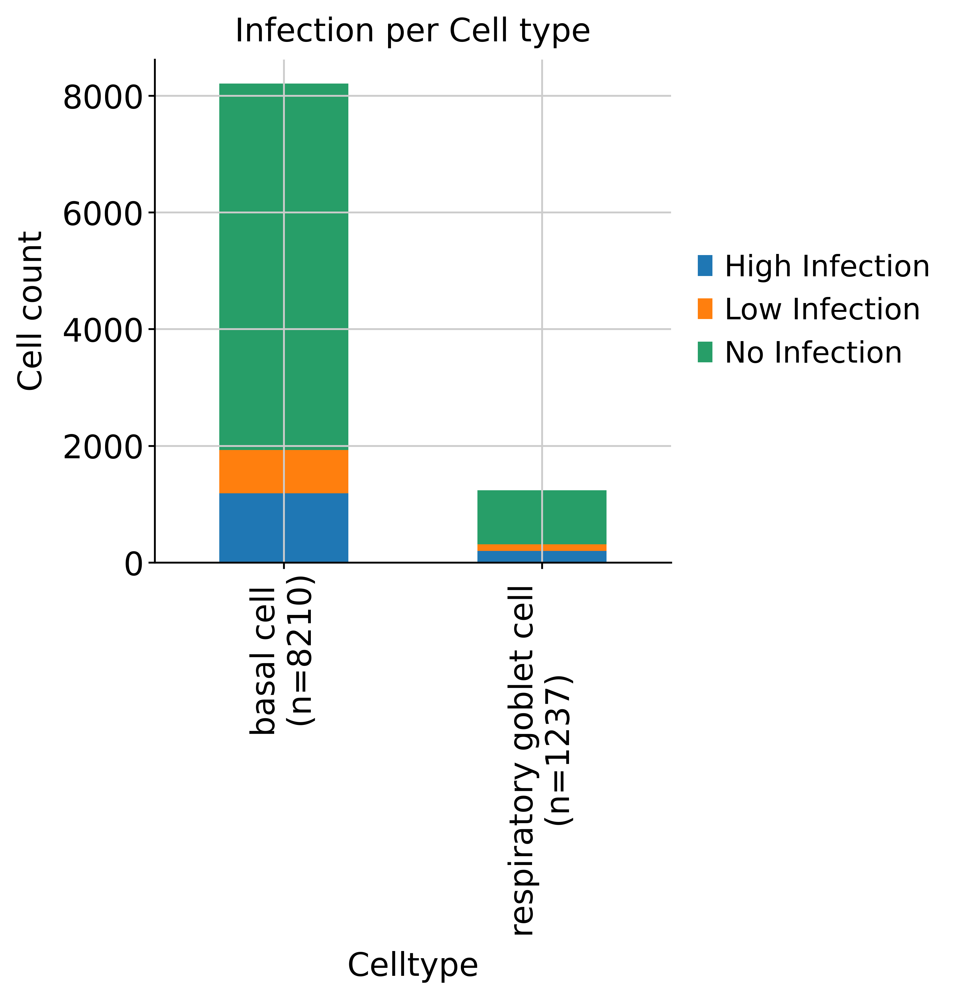

In [73]:
ax = df.plot.bar(stacked=True)

ax.set_title('Infection per Cell type')


ax.set_xlabel('Celltype')
ax.set_ylabel('Cell count')
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax.get_figure().savefig('round2_figs/infection_per_ct_all_round2.pdf', bbox_inches='tight', dpi=300)


In [74]:
df = df.divide(np.sum(df, axis=1), axis=0)


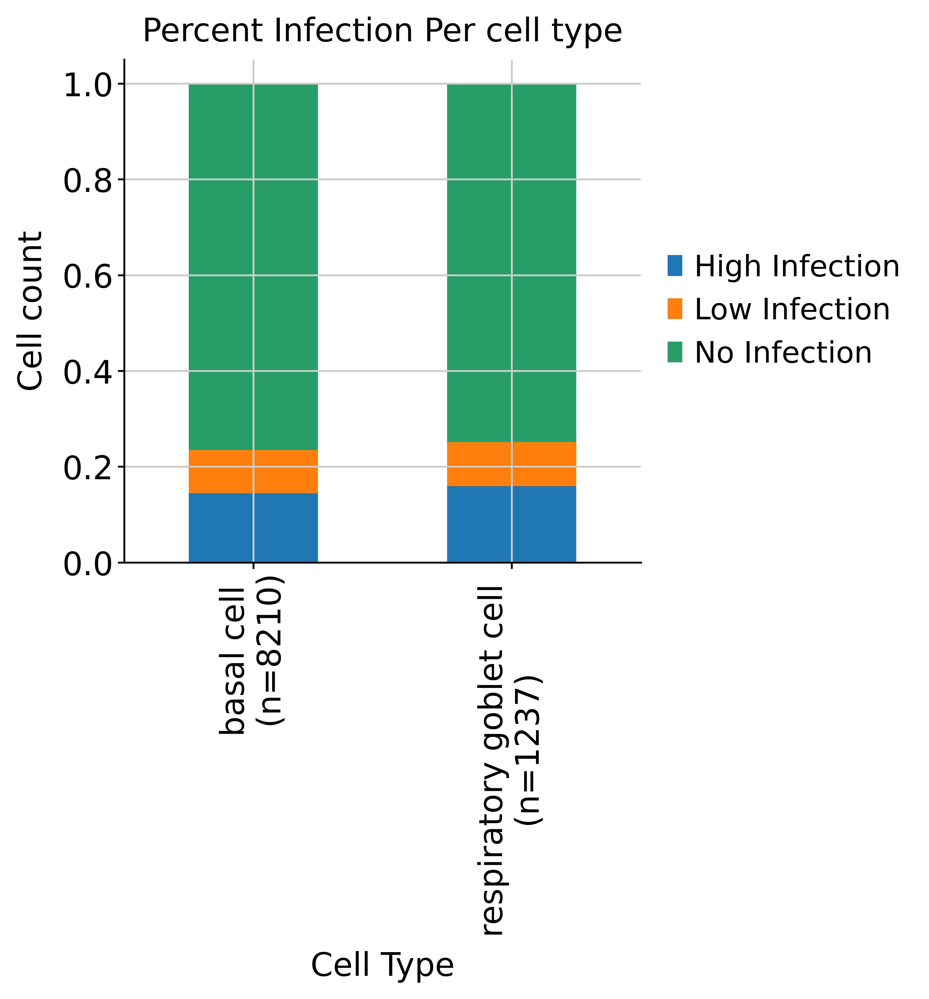

In [75]:
ax = df.plot.bar(stacked=True)
ax.set_title('Percent Infection Per cell type')

ax.set_xlabel('Cell Type')
ax.set_ylabel('Cell count')

ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax.get_figure().savefig('round2_figs/round2_infection_per_ct_all_round2_percentage.pdf', bbox_inches='tight', dpi=300)


# celltype per variant

In [28]:
adata

AnnData object with n_obs × n_vars = 10615 × 36611
    obs: 'infection', 'variant', 'condition', 'library_size', 'library_size_log', 'SARS2_genome_ORF1ab_counts', 'SARS2_genome_ORF1ab_log', 'SARS2_genome_S_counts', 'SARS2_genome_S_log', 'SARS2_genome_ORF3a_counts', 'SARS2_genome_ORF3a_log', 'SARS2_genome_E_counts', 'SARS2_genome_E_log', 'SARS2_genome_M_counts', 'SARS2_genome_M_log', 'SARS2_genome_ORF6_counts', 'SARS2_genome_ORF6_log', 'SARS2_genome_ORF7a_counts', 'SARS2_genome_ORF7a_log', 'SARS2_genome_ORF8_counts', 'SARS2_genome_ORF8_log', 'SARS2_genome_N_counts', 'SARS2_genome_N_log', 'SARS2_genome_ORF10_counts', 'SARS2_genome_ORF10_log', 'sars2_total_counts', 'sars2_total_counts_log', 'sars2_lib_size_ratio', 'round', 'condition_variant', 'round_variant_condition', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'ts_consensus_prediction', 'ts_consensus_percentage', 'knn_on_bbknn_pred', 'knn_on_scvi_offline_pred', 'scanvi_offline_pred', 'svm_pred', 'rf_pred', 

In [29]:
df = adata.obs.groupby(['manual_ct_annotation', 'variant']).size().unstack(0)

In [30]:
df

manual_ct_annotation,basal cell,lung ciliated cell,respiratory goblet cell
variant,,,
Alpha,1417,2,269
Beta_A,1857,0,275
Beta_B,2116,2,161
Epsilon,1236,1,174
Uninfected,838,1,322
WA-1,1584,2,358


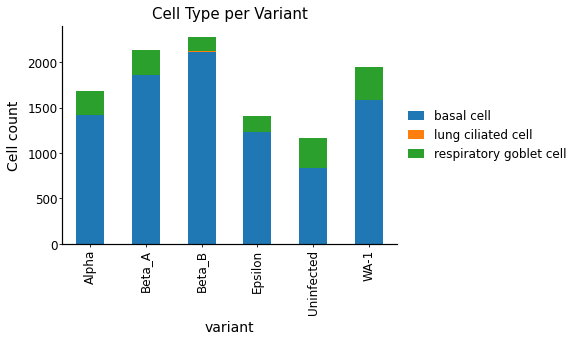

In [31]:
ax = df.plot.bar(stacked=True)
ax.set_xlabel('variant')
ax.set_ylabel('Cell count')
ax.set_title('Cell Type per Variant')
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax.get_figure().savefig('round2_figs/round2_celltype_per_variant.pdf', bbox_inches='tight', dpi=300)

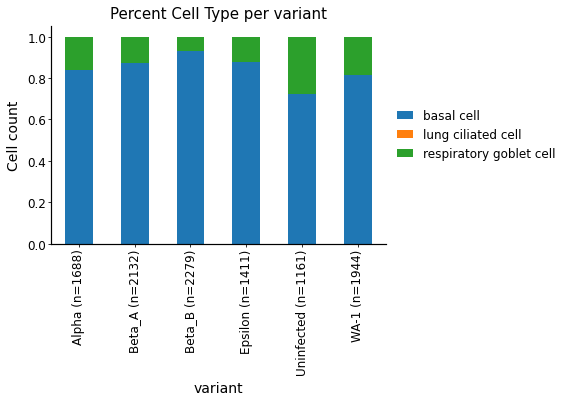

In [32]:
df.index = [f'{a} (n={b})' for a,b in zip(df.index,np.sum(df, axis=1).values)]
df = df.divide(np.sum(df, axis=1), axis=0)

ax = df.plot.bar(stacked=True)
ax.set_xlabel('variant')
ax.set_ylabel('Cell count')
ax.set_title('Percent Cell Type per variant')
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax.get_figure().savefig('round2_figs/round2_celltype_per_variant_pct.pdf', bbox_inches='tight')

# umaps

In [33]:
sc.set_figure_params(scanpy=True, 
                     dpi=300,
                     dpi_save=300,
                     frameon=True,
                     vector_friendly=True,
                     fontsize=14,
                     figsize=None,
                     color_map=None,
                     format='png',
                     facecolor=None,
                     transparent=False,
                     ipython_format='png2x')


In [34]:
adata

AnnData object with n_obs × n_vars = 10615 × 36611
    obs: 'infection', 'variant', 'condition', 'library_size', 'library_size_log', 'SARS2_genome_ORF1ab_counts', 'SARS2_genome_ORF1ab_log', 'SARS2_genome_S_counts', 'SARS2_genome_S_log', 'SARS2_genome_ORF3a_counts', 'SARS2_genome_ORF3a_log', 'SARS2_genome_E_counts', 'SARS2_genome_E_log', 'SARS2_genome_M_counts', 'SARS2_genome_M_log', 'SARS2_genome_ORF6_counts', 'SARS2_genome_ORF6_log', 'SARS2_genome_ORF7a_counts', 'SARS2_genome_ORF7a_log', 'SARS2_genome_ORF8_counts', 'SARS2_genome_ORF8_log', 'SARS2_genome_N_counts', 'SARS2_genome_N_log', 'SARS2_genome_ORF10_counts', 'SARS2_genome_ORF10_log', 'sars2_total_counts', 'sars2_total_counts_log', 'sars2_lib_size_ratio', 'round', 'condition_variant', 'round_variant_condition', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'ts_consensus_prediction', 'ts_consensus_percentage', 'knn_on_bbknn_pred', 'knn_on_scvi_offline_pred', 'scanvi_offline_pred', 'svm_pred', 'rf_pred', 

In [35]:
adata.obs['NFKBIA_log'] = np.log(np.array(adata[:,'NFKBIA'].X.todense())+1)

In [36]:
label, count = np.unique(adata.obs['manual_ct_annotation'], return_counts=True)
add_count_dict = {a:f'{a} (n={b})' for a,b in zip(label,count)}

adata.obs['manual_ct_annotation_plus_n']  = adata.obs['manual_ct_annotation'].replace(add_count_dict)

In [37]:
import matplotlib.pyplot as plt

... storing 'manual_ct_annotation_plus_n' as categorical


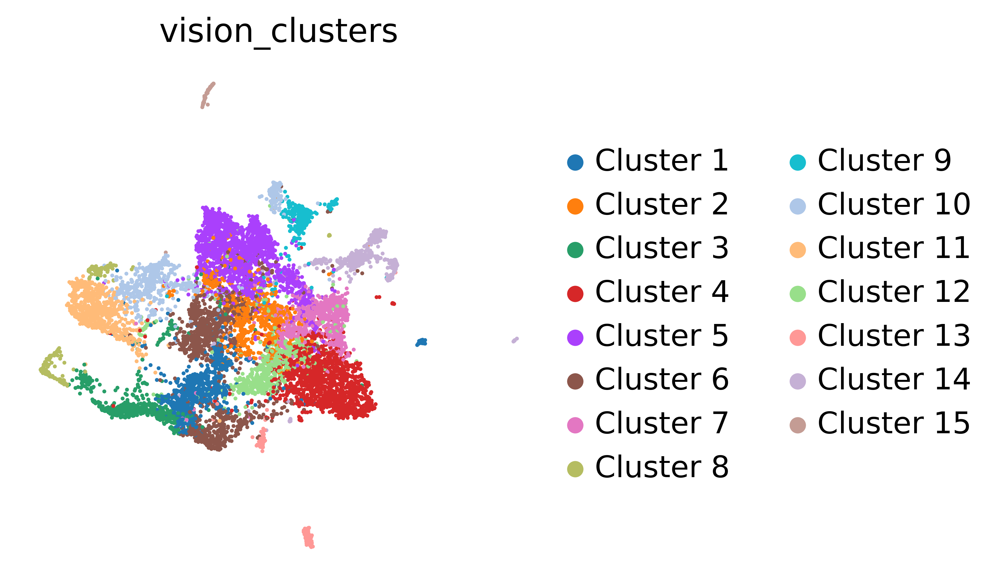

In [38]:
ax = sc.pl.umap(adata, 
                color = ['vision_clusters'],
                ncols = 1, 
                frameon=False,
                save='round2_vision_clusters.pdf', 
                return_fig=True
               )
ax.savefig('round2_figs/round2_vision_clusters.pdf', bbox_inches='tight', dpi=300)




... storing 'r2_vision_clusters_annotated_plus_n' as categorical
... storing 'variant_plus_n' as categorical


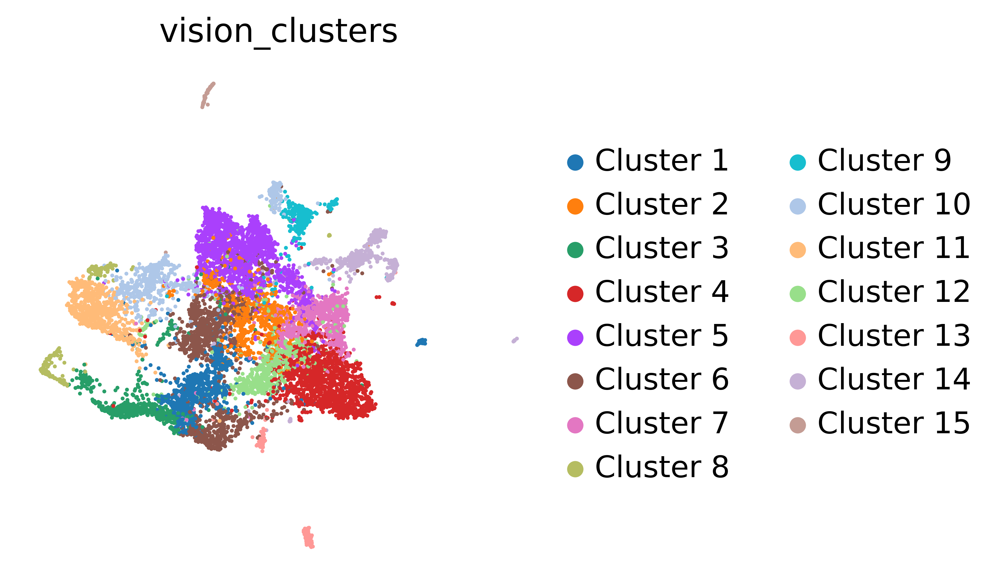

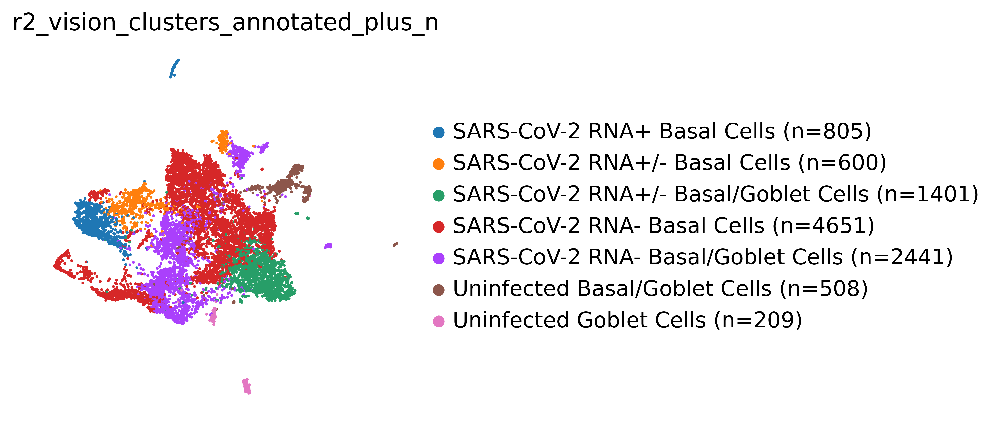

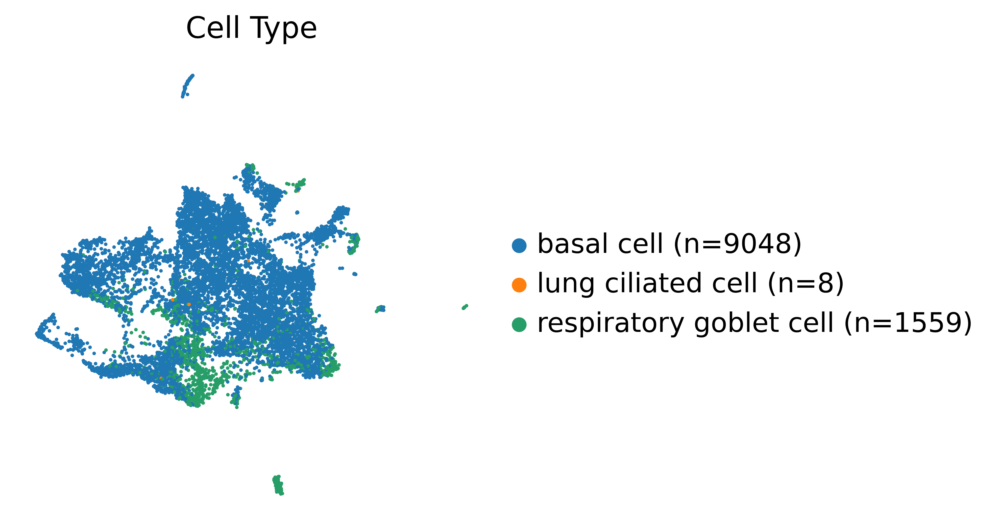

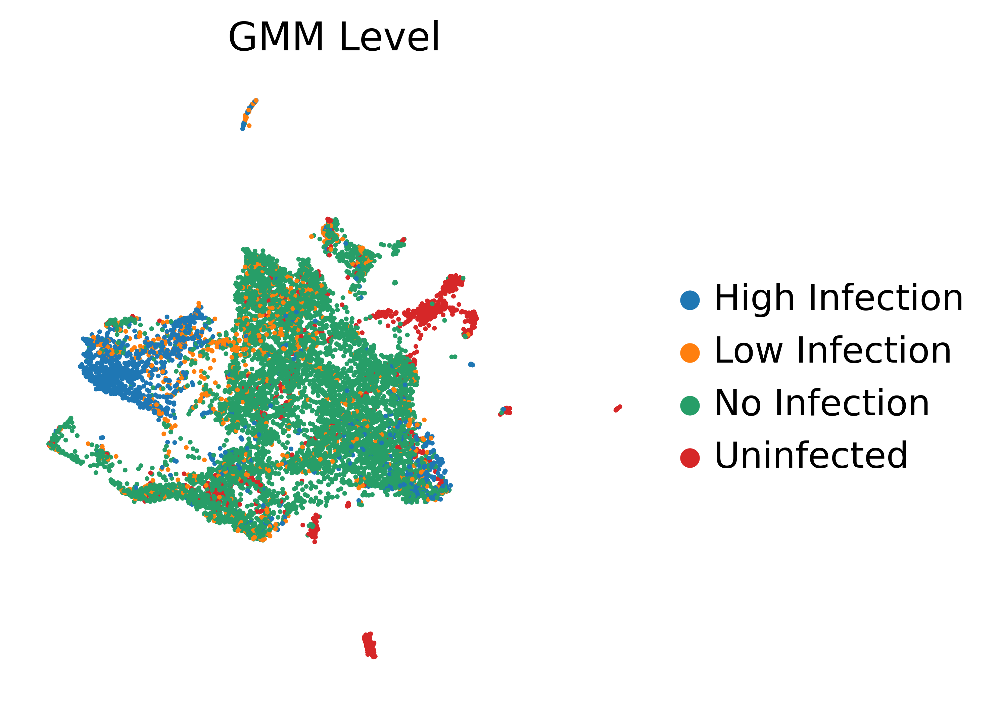

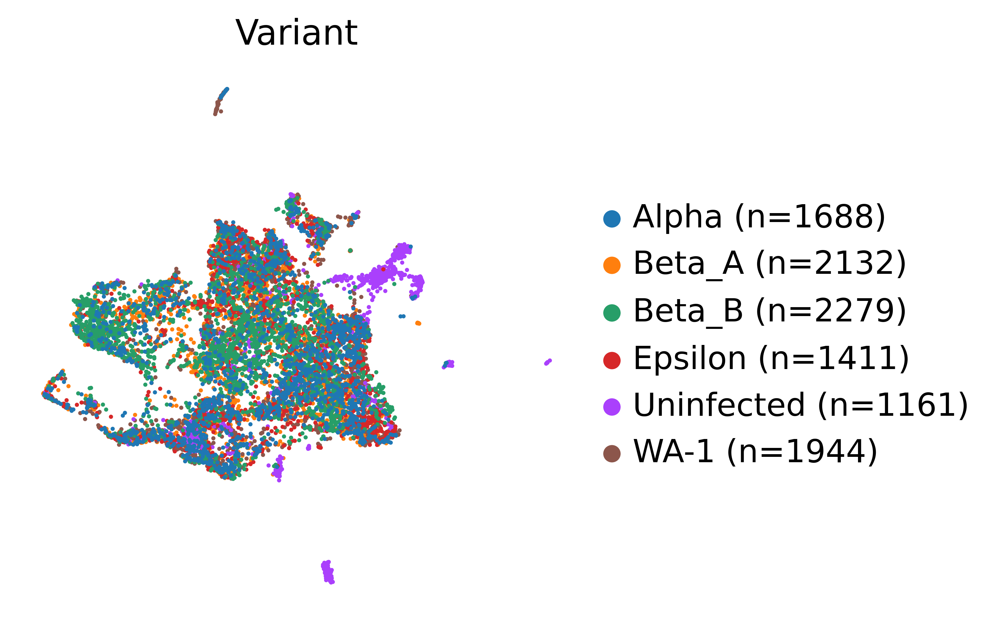

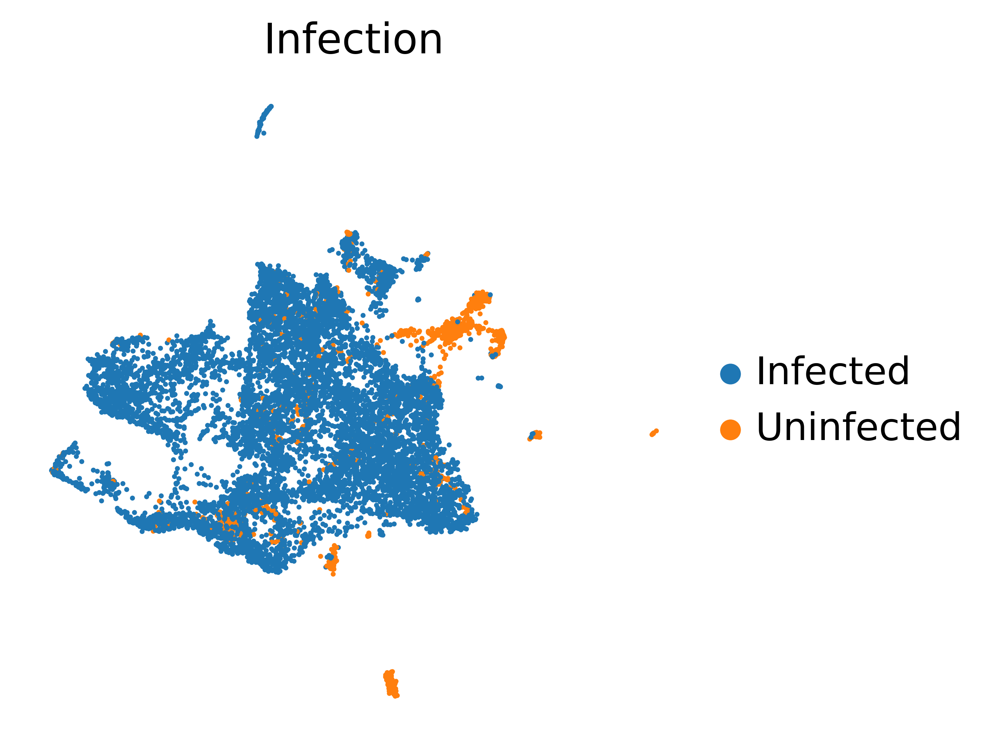

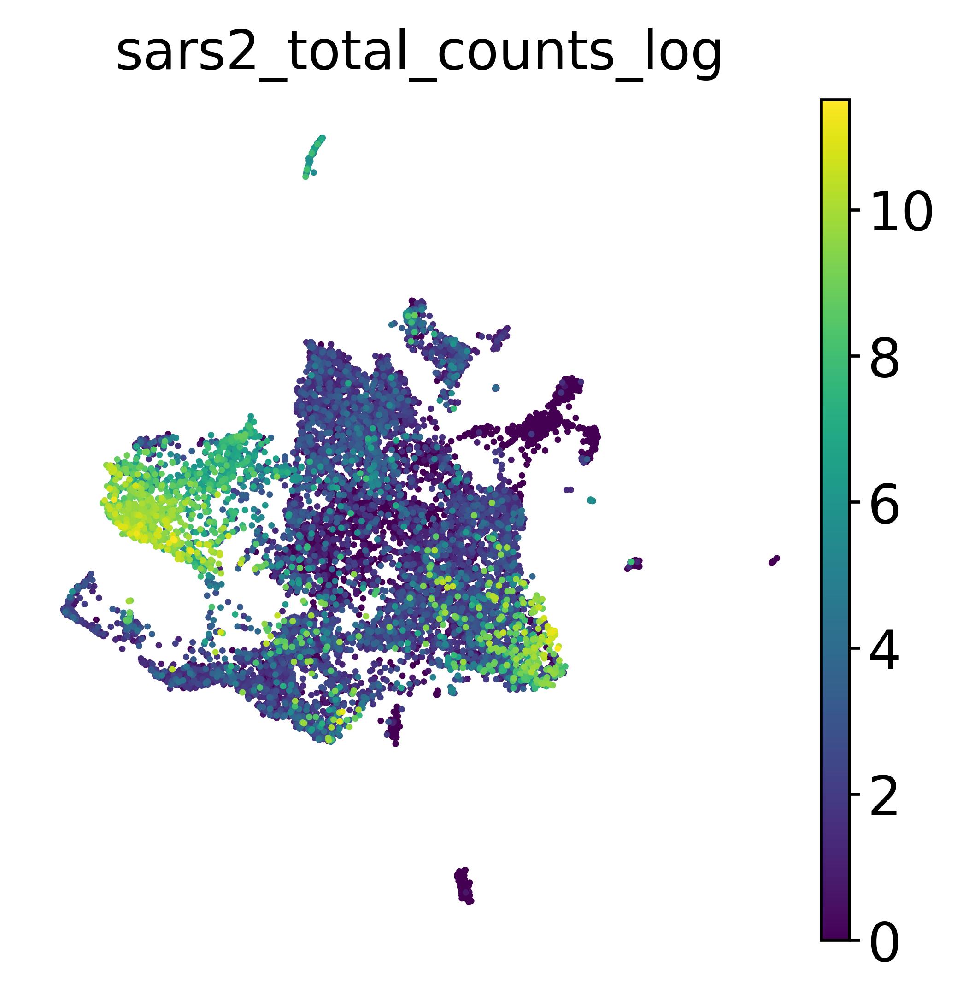

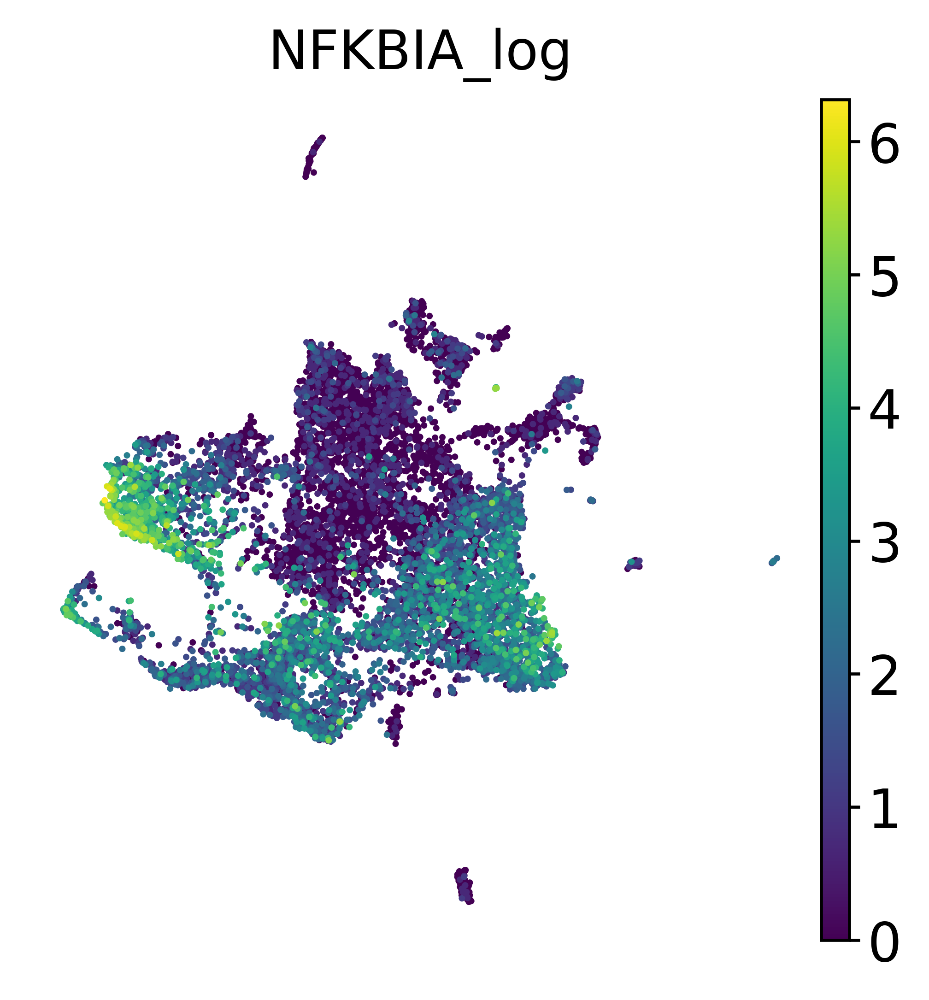

In [39]:


ax = sc.pl.umap(adata, 
       color = ['vision_clusters'],
       ncols = 1, 
       frameon=False,
       save='round2_vision_clusters.pdf',
        return_fig=True,

           
      )

ax.savefig('round2_figs/round2_vision_clusters.pdf', bbox_inches='tight', dpi=300)


label, count = np.unique(adata.obs['r2_vision_clusters_annotated'], return_counts=True)
add_count_dict = {a:f'{a} (n={b})' for a,b in zip(label,count)}
adata.obs['r2_vision_clusters_annotated_plus_n']  = adata.obs['r2_vision_clusters_annotated'].replace(add_count_dict)

ax = sc.pl.umap(adata, 
       color = ['r2_vision_clusters_annotated_plus_n'],
       ncols = 1, 
       frameon=False,
       save='round2_vision_clusters_annotated.pdf',
        return_fig=True           
           
      )

ax.savefig('round2_figs/round2_vision_clusters_annotated.pdf', bbox_inches='tight',dpi=300)

ax = sc.pl.umap(adata, 
       color = ['manual_ct_annotation_plus_n'],
       ncols = 1, 
       frameon=False,
                return_fig=True,
                title = 'Cell Type'
                
      )

ax.savefig('round2_figs/4C_round2_manual_ct_annotation.pdf', bbox_inches='tight')

ax = sc.pl.umap(adata, 
       color = ['infection_gmm_annotated'],
       ncols = 1, 
       frameon=False,
       save='round2_infection_gmm_annotated.pdf', 
                return_fig=True,
                                title = 'GMM Level'
                
      )
ax.savefig('round2_figs/4D_round2_infection_gmm_annotated.pdf', bbox_inches='tight')

label, count = np.unique(adata.obs['variant'], return_counts=True)
add_count_dict = {a:f'{a} (n={b})' for a,b in zip(label,count)}
adata.obs['variant_plus_n']  = adata.obs['variant'].replace(add_count_dict)

ax = sc.pl.umap(adata, 
       color = ['variant_plus_n'],
       ncols = 1, 
       frameon=False,
       save='7round2_variant.pdf', 
                return_fig=True,
                                title = 'Variant'
                
      )

ax.savefig('round2_figs/4A_round2_variant.pdf', bbox_inches='tight')

ax = sc.pl.umap(adata, 
       color = ['infection_str'],
       ncols = 1, 
       frameon=False,
       save='round2_infection.pdf',
                return_fig=True,
                                title = 'Infection'
                
      )
ax.savefig('round2_figs/4B_round2_infection.pdf', bbox_inches='tight')

ax = sc.pl.umap(adata, 
       color = ['sars2_total_counts_log'],
       ncols = 1, 
       frameon=False,
       save='round2_scv2_log.pdf', 
                return_fig=True
      )
ax.savefig('round2_figs/round2_scv2_log.pdf', bbox_inches='tight')


ax = sc.pl.umap(adata, 
       color = ['NFKBIA_log'],
       ncols = 1, 
       frameon=False,
       save='round2_nfkbia_log.pdf', 
                return_fig=True
                
      )
ax.savefig('round2_figs/round2_nfkbia_log.pdf', bbox_inches='tight')


# Plotting ISGs

In [40]:
isg_full = list(pd.read_csv('gene_sigs/full gene list.txt').columns)


In [41]:
isg_full += [v for v in adata.var_names if 'ISG' in v]
isg_full += [v for v in adata.var_names if 'IRF' in v]
isg_full = set(isg_full)

In [42]:
len(isg_full)

197

In [43]:

highinf_de_genes = pd.read_csv('7.2_go_analysis_results/round2_high_infection_vs_uninfected.csv', header=None)



In [44]:
highinf_de_genes

,0,1
0,NFKBIA,0.000000e+00
1,PLAU,3.755170e-250
2,CXCL8,4.617484e-222
3,CXCL3,1.136666e-191
4,NCOA7,4.764149e-201
...,...,...
36583,KRT19,1.336326e-201
36584,S100A11,6.918980e-203
36585,RPL41,4.609689e-214
36586,S100A6,1.021025e-217


In [45]:
top_de = highinf_de_genes[0][:100]

In [46]:
filtered_isgs = list(set(isg_full).intersection(set(top_de)))

In [47]:
filtered_isgs = np.array(filtered_isgs)

In [48]:
# this is to reorder the ISGs based on avg expression (low -> high)
# filtered_isgs=filtered_isgs[list(np.array(np.argsort(np.sum(adata[:,filtered_isgs].X, axis=0))).reshape(-1))]

# next lines to reorder ISGs based on difference between I and U groups:

infected_isg_counts = np.sum(adata[adata.obs['infection']=='I',filtered_isgs].X.toarray(), axis=0)
uninfected_isg_counts = np.sum(adata[adata.obs['infection']=='U',filtered_isgs].X.toarray(), axis=0)

sum_counts = infected_isg_counts+uninfected_isg_counts

filtered_isgs = filtered_isgs[np.argsort((infected_isg_counts - uninfected_isg_counts)/sum_counts)[::-1]]

In [49]:

np.unique(adata.obs['variant'])


array(['Alpha', 'Beta_A', 'Beta_B', 'Epsilon', 'Uninfected', 'WA-1'],
      dtype=object)

In [50]:

variant_plotting_order = ['Alpha',
                          'Beta_A',
                          'Beta_B', 
                          'Epsilon',
                          'WA-1', 
                          'Uninfected']



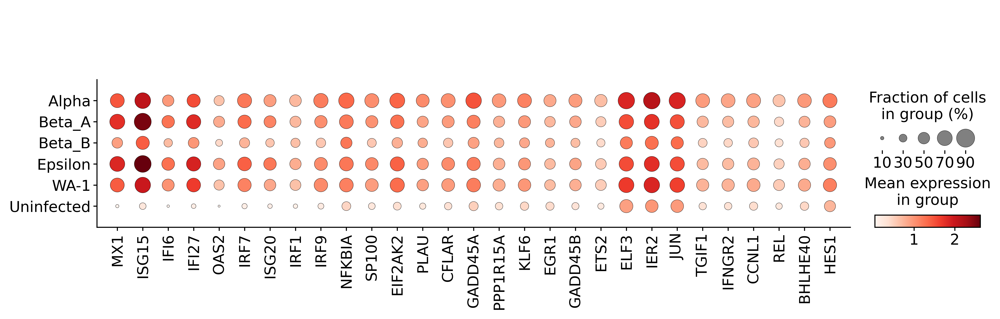

In [51]:
with plt.rc_context({"figure.figsize": (4, 4), "figure.dpi": (300)}):
    
    ax = sc.pl.dotplot(adata,
                  filtered_isgs,
                  groupby = 'variant', 
                  log = True, 
                  categories_order = variant_plotting_order, return_fig=True
                 )
    ax.savefig('round2_figs/round2_isgs_intersectedwith_highinfection_vs_uninfected_top100_corr.pdf', bbox_inches='tight')


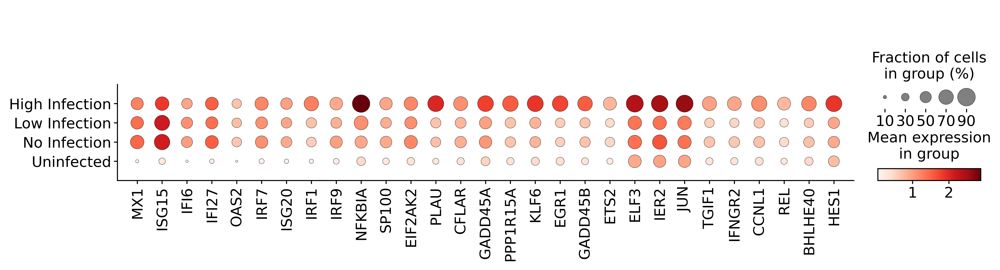

In [52]:
with plt.rc_context({"figure.figsize": (4, 4), "figure.dpi": (300)}):
    
    ax = sc.pl.dotplot(adata,
                  filtered_isgs,
                  groupby = 'infection_gmm_annotated', 
                  log = True, 
                       return_fig=True
                 )
    ax.savefig('round2_figs/round2_isgs_by_gmm_infection.pdf', bbox_inches='tight')


# Plotting IFN GO terms

In [53]:
ifn_go_filtered = pd.read_csv('gene_sigs/IFN GO Terms filtered_greater_than_30percent_cells expression.txt', header=None)


In [54]:
adata

AnnData object with n_obs × n_vars = 10615 × 36611
    obs: 'infection', 'variant', 'condition', 'library_size', 'library_size_log', 'SARS2_genome_ORF1ab_counts', 'SARS2_genome_ORF1ab_log', 'SARS2_genome_S_counts', 'SARS2_genome_S_log', 'SARS2_genome_ORF3a_counts', 'SARS2_genome_ORF3a_log', 'SARS2_genome_E_counts', 'SARS2_genome_E_log', 'SARS2_genome_M_counts', 'SARS2_genome_M_log', 'SARS2_genome_ORF6_counts', 'SARS2_genome_ORF6_log', 'SARS2_genome_ORF7a_counts', 'SARS2_genome_ORF7a_log', 'SARS2_genome_ORF8_counts', 'SARS2_genome_ORF8_log', 'SARS2_genome_N_counts', 'SARS2_genome_N_log', 'SARS2_genome_ORF10_counts', 'SARS2_genome_ORF10_log', 'sars2_total_counts', 'sars2_total_counts_log', 'sars2_lib_size_ratio', 'round', 'condition_variant', 'round_variant_condition', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'ts_consensus_prediction', 'ts_consensus_percentage', 'knn_on_bbknn_pred', 'knn_on_scvi_offline_pred', 'scanvi_offline_pred', 'svm_pred', 'rf_pred', 

In [55]:
ifn_go_filtered

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,AZI2,IFI27,IFITM1,IFITM3,IFNAR1,IRAK1,IRF1,IRF2,IRF3,IRF6,IRF7,IRF9,JAK1,OAS1,OAS2,SP100,STAT1,STAT2,TANK


In [56]:
ifn_go_filtered = list(ifn_go_filtered.iloc[0])

In [57]:
ifn_go_filtered

['AZI2',
 'IFI27',
 'IFITM1',
 'IFITM3',
 'IFNAR1',
 'IRAK1',
 'IRF1',
 'IRF2',
 'IRF3',
 'IRF6',
 'IRF7',
 'IRF9',
 'JAK1',
 'OAS1',
 'OAS2',
 'SP100',
 'STAT1',
 'STAT2',
 'TANK']

In [58]:
variant_categories = ['Alpha', 'Beta_A', 'Beta_B', 'Epsilon', 'WA-1', 'Uninfected']

In [59]:
import matplotlib.pyplot as plt

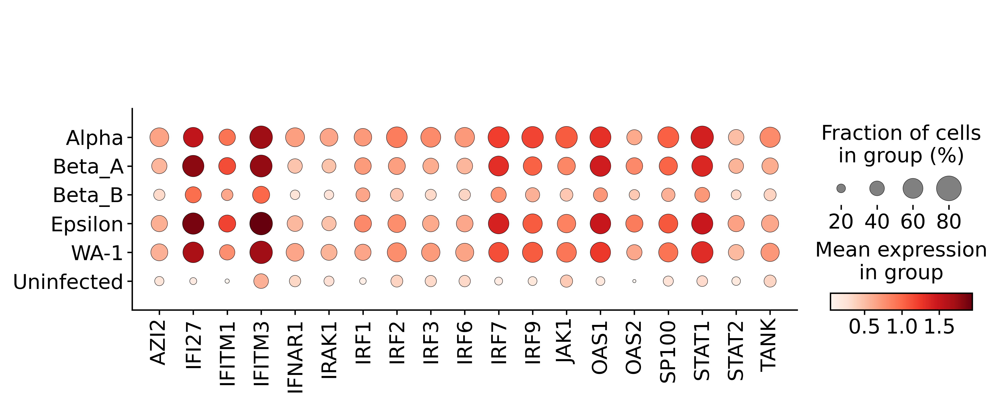

In [60]:
with plt.rc_context({"figure.figsize": (4, 4), "figure.dpi": (300)}):
    sc.pl.dotplot(adata,
                  ifn_go_filtered,
                  groupby = 'variant', 
                  save = 'round2_ifn_go_filtered_variant.png',
                  log = True, 
                  categories_order = variant_categories
                 )


# Plotting IFNs only

In [61]:
interferons = ["IFNL1", "IFNL2", "IFNL3", "IFNB1", "IFNG", "IFNA2", "IL6", ]

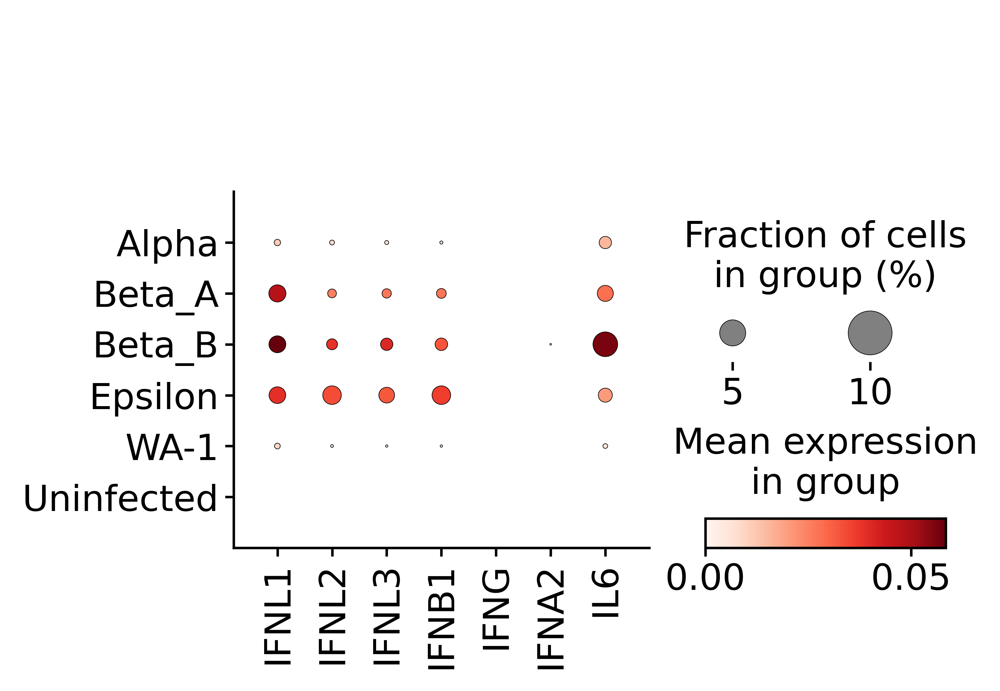

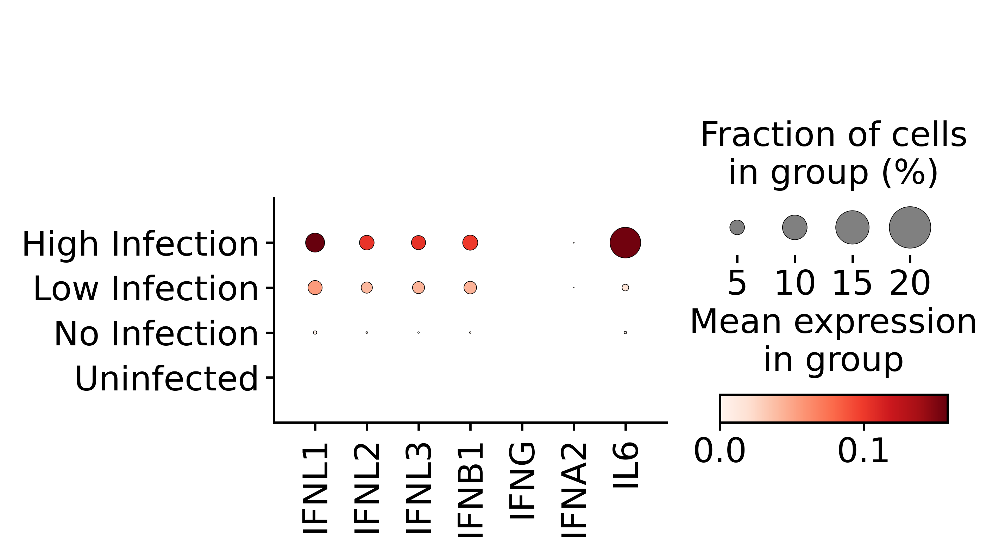

In [62]:
with plt.rc_context({"figure.figsize": (2, 2), "figure.dpi": (300)}):
    ax = sc.pl.dotplot(adata,
                  interferons,
                  groupby = 'variant', 
                  save = 'round2_camille_ifns_variant.png',
                  log = True, 
                  categories_order = variant_categories,
                       return_fig=True
                 )
    ax.savefig('round2_figs/round2_camille_ifns_variant.pdf', bbox_inches='tight')
    ax = sc.pl.dotplot(adata,
                  interferons,
                  groupby = 'infection_gmm_annotated', 
                  save = 'round2_camille_ifns_variant.png',
                  log = True, 
#                   categories_order = variant_categories,
                       return_fig=True
                 )
    ax.savefig('round2_figs/round2_camille_ifns_infection.pdf', bbox_inches='tight')
